此程式馬用於對ECCE2025的Zero NG paper 進行開發\n 為了避免程式過於雜亂，此note 專門用於GRU架構下的資料分析進行續練

In [19]:
# import used functioons 
#  import tools 
%matplotlib inline
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Input, Conv1D, Dense, concatenate, RepeatVector, MaxPooling1D, Activation ,UpSampling1D, Conv1DTranspose, Concatenate
from tensorflow.keras.utils import plot_model

import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("GPU devices found:")
    for gpu in gpus:
        print(gpu)
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

import numpy as np 
import pandas as pd
from openpyxl import Workbook
import matplotlib.pyplot as plt
import os
import sys
import csv
import time
from IPython import embed

from rul_features.rul_data_read import read_rul_data

from test_algs.CCAE_ntu_rul import get_initial_files_datalist, CCAE_train
from test_algs.CCAE_ntu_rul import CCAE_model_application, CCAE_model_build_train



GPU devices found:
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


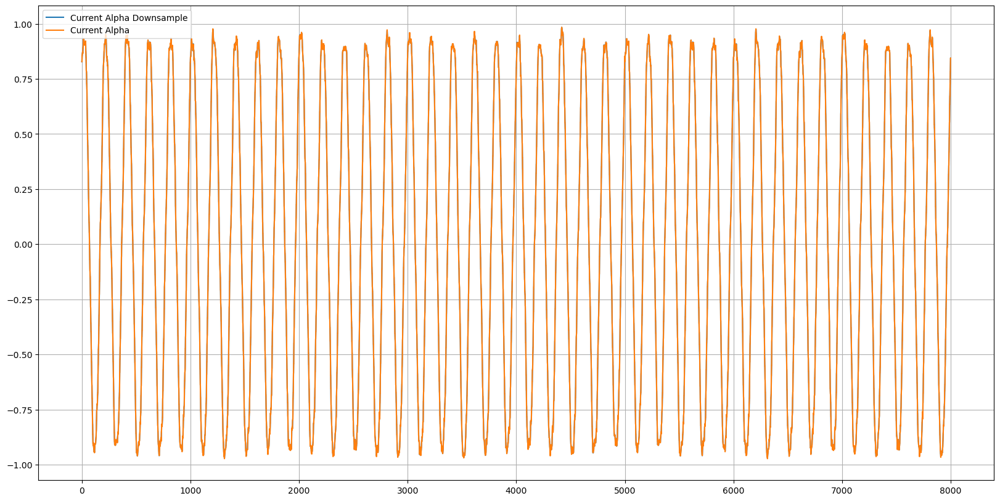

In [20]:

df = read_rul_data(r"D:\OneDrive\CCAE_experiments\CCAE_datasets\Normal2\0611_3000_2_0V\RUL_Data_3_2.parquet")

plt.figure(figsize=(20, 10))
plt.plot(df["Current alpha downsample"], label='Current Alpha Downsample')
plt.plot(df["Current alpha"], label='Current Alpha')
plt.legend()
plt.grid(True)
plt.show()


# 建立模型 #

In [21]:

from datetime import datetime
import json
from tensorflow.keras.layers import Input, RepeatVector, Concatenate, Conv1D, MaxPooling1D, Activation, Dense, UpSampling1D, concatenate, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv1DTranspose
import os


def build_gruae_model_repeat_condition(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name):
    """
    Build and save a GRU-based autoencoder model with condition input.
    這個版本會：
    1. 將 repeated condition 在一開始就 concat 到 series_input
    2. 保證輸出長度與輸入相同
    """
    from tensorflow.keras.layers import Input, Concatenate, RepeatVector, GRU, Conv1D, MaxPooling1D, Activation, Dense, UpSampling1D
    from tensorflow.keras.models import Model
    from tensorflow.keras.utils import plot_model
    import os, json
    from datetime import datetime

    # Series Inputs
    inputs = []
    for idx, input_dim in enumerate(input_dim_list):
        input_layer = Input(shape=(sequence_length, input_dim), name=f'series_{idx}')
        inputs.append(input_layer)
    series_input = Concatenate(axis=-1, name='series_input_concat')(inputs)

    # Condition Inputs
    condition_input_1 = Input(shape=(condition_dim,), name='condition_1')
    condition_input_2 = Input(shape=(condition_dim,), name='condition_2')

    # Repeat condition to match sequence length
    repeated_condition_1 = RepeatVector(sequence_length)(condition_input_1)
    repeated_condition_2 = RepeatVector(sequence_length)(condition_input_2)

    # Merge repeated condition at the very start
    merged_input = Concatenate(axis=-1, name='merge_condition_to_series')([series_input, repeated_condition_1, repeated_condition_2])

    # Encoder: GRU + Conv + Pooling
    x = GRU(units=32, return_sequences=True)(merged_input)
    x = Conv1D(filters=32, kernel_size=8, strides=2, padding='same')(x)
    x = MaxPooling1D(pool_size=2)(x)
    x = Activation('relu')(x)

    x = Conv1D(filters=16, kernel_size=6, padding='same')(x)
    x = MaxPooling1D(pool_size=2)(x)
    x = Activation('relu')(x)

    x = Conv1D(filters=8, kernel_size=4, padding='same')(x)
    x = MaxPooling1D(pool_size=2)(x)
    encoded = Activation('relu')(x)

    encoder_model = Model(inputs=inputs + [condition_input_1, condition_input_2], outputs=encoded, name='Encoder')
    plot_model(encoder_model, show_shapes=True, show_layer_names=True)
    encoder_model.summary()

    # Decoder Input
    decoder_input = Input(shape=encoder_model.output_shape[1:], name='encoder_output')

    # Decoder: UpSampling + Conv1D
    x = UpSampling1D(size=2)(decoder_input)
    x = Conv1D(16, kernel_size=5, padding='same')(x)
    x = Activation('relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(16, kernel_size=5, padding='same')(x)
    x = Activation('relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(32, kernel_size=5, padding='same')(x)
    x = Activation('relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(32, kernel_size=5, padding='same')(x)
    x = Activation('relu')(x)

    # 最後用 GRU 重建完整序列
    x = GRU(32, return_sequences=True)(x)

    # 多通道輸出
    output_list = [
        Dense(dim, activation='linear', name=f'output_{idx}')(x)
        for idx, dim in enumerate(input_dim_list)
    ]

    decoder_model = Model(inputs=decoder_input, outputs=output_list, name='Decoder')

    # 整合 Encoder 與 Decoder
    encoded = encoder_model(inputs + [condition_input_1, condition_input_2])
    decoder_outputs = decoder_model(encoded)

    model = Model(inputs=inputs + [condition_input_1, condition_input_2], outputs=decoder_outputs,
                  name=f'GRUAE_model{series_input.shape[2]}_in_{len(output_list)}_out')

    # 可選的 model 儲存
    os.makedirs(os.path.join(model_folder_path, "models"), exist_ok=True)
    os.makedirs(os.path.join(model_folder_path, "model_inform"), exist_ok=True)
    model.save(os.path.join(model_folder_path, "models", model_name))

    # metadata
    metadata = {
        "model_name": model_name,
        "input_dim_list": input_dim_list,
        "sequence_length": sequence_length,
        "condition_dim": condition_dim,
        "created_at": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        "trained": False,
        "train_date": None,
        "condition_channels": 2
    }
    with open(os.path.join(model_folder_path, "model_inform", model_name.replace('.keras', '_metadata.json')), "w", encoding="utf-8") as f:
        json.dump(metadata, f, ensure_ascii=False, indent=4)

    return model, encoder_model, decoder_model

def build_gruae_model_initial_condition_dropout(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name):
    """
    GRU-based autoencoder with:
    - condition as GRU initial state
    - Dropout on input for denoising
    - fully combined into a single model
    """
    from tensorflow.keras.layers import Input, Concatenate, GRU, Conv1D, MaxPooling1D, Activation, Dense, UpSampling1D, Dropout
    from tensorflow.keras.models import Model
    from tensorflow.keras.utils import plot_model
    import os, json
    from datetime import datetime

    # === Series Inputs with Dropout ===
    inputs = []
    noisy_inputs = []
    for idx, input_dim in enumerate(input_dim_list):
        input_layer = Input(shape=(sequence_length, input_dim), name=f'series_{idx}')
        dropout_layer = Dropout(0.05, name=f'input_dropout_{idx}')(input_layer)
        inputs.append(input_layer)
        noisy_inputs.append(dropout_layer)
    series_input = Concatenate(axis=-1, name='series_input_concat')(noisy_inputs)

    # === Condition inputs ===
    condition_input_1 = Input(shape=(condition_dim,), name='condition_1')
    condition_input_2 = Input(shape=(condition_dim,), name='condition_2')
    merged_condition = Concatenate(name="merged_condition")([condition_input_1, condition_input_2])

    # === Map condition to GRU initial_state
    initial_state_h = Dense(32, activation='tanh', name='init_state_dense')(merged_condition)

    # === Encoder: GRU + Conv + Pooling
    x = GRU(units=32, return_sequences=True, name='encoder_gru')(series_input, initial_state=initial_state_h)
    x = Conv1D(filters=32, kernel_size=8, strides=2, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    x = Conv1D(filters=16, kernel_size=6, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    x = Conv1D(filters=8, kernel_size=4, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    # === Decoder: UpSampling + Conv1D + GRU
    x = UpSampling1D(size=2)(x)
    x = Conv1D(16, kernel_size=5, padding='same', activation='relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(16, kernel_size=5, padding='same', activation='relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(32, kernel_size=5, padding='same', activation='relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(32, kernel_size=5, padding='same', activation='relu')(x)

    x = GRU(32, return_sequences=True)(x)

    # === Output per channel ===
    output_list = [
        Dense(dim, activation='linear', name=f'output_{idx}')(x)
        for idx, dim in enumerate(input_dim_list)
    ]

    # === Final single combined model ===
    model = Model(inputs=inputs + [condition_input_1, condition_input_2], outputs=output_list,
                  name=f'GRUAE_model_initcond_dropout_{series_input.shape[2]}in_{len(output_list)}out')

    # === Save structure & model ===
    os.makedirs(os.path.join(model_folder_path, "models"), exist_ok=True)
    os.makedirs(os.path.join(model_folder_path, "model_inform"), exist_ok=True)
    plot_model(model, 
               to_file=os.path.join(model_folder_path, "model_inform", f"{model_name}_structure.png"),
               show_shapes=True, show_layer_names=True)

    model.save(os.path.join(model_folder_path, "models", model_name))

    # === Save metadata
    metadata = {
        "model_name": model_name,
        "input_dim_list": input_dim_list,
        "sequence_length": sequence_length,
        "condition_dim": condition_dim,
        "created_at": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        "trained": False,
        "train_date": None,
        "condition_channels": 2
    }
    with open(os.path.join(model_folder_path, "model_inform", model_name.replace('.keras', '_metadata.json')), "w", encoding="utf-8") as f:
        json.dump(metadata, f, ensure_ascii=False, indent=4)

    return model


def build_gruae_model_initial_condition(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name):
    """
    GRU-based autoencoder with:
    - condition as GRU initial state
    - Dropout on input for denoising
    - fully combined into a single mod
    """
    from tensorflow.keras.layers import Input, Concatenate, GRU, Conv1D, MaxPooling1D, Activation, Dense, UpSampling1D, Dropout
    from tensorflow.keras.models import Model
    from tensorflow.keras.utils import plot_model
    import os, json
    from datetime import datetime

    # === Series Inputs with Dropout ===
    inputs = []
    noisy_inputs = []
    for idx, input_dim in enumerate(input_dim_list):
        input_layer = Input(shape=(sequence_length, input_dim), name=f'series_{idx}')
        inputs.append(input_layer)
        noisy_inputs.append(input_layer)
        series_input = Concatenate(axis=-1, name='series_input_concat')(noisy_inputs)

    # === Condition inputs ===
    condition_input_1 = Input(shape=(condition_dim,), name='condition_1')
    condition_input_2 = Input(shape=(condition_dim,), name='condition_2')
    merged_condition = Concatenate(name="merged_condition")([condition_input_1, condition_input_2])

    # === Map condition to GRU initial_state
    initial_state_h = Dense(32, activation='tanh', name='init_state_dense')(merged_condition)

    # === Encoder: GRU + Conv + Pooling
    x = GRU(units=32, return_sequences=True, name='encoder_gru')(series_input, initial_state=initial_state_h)
    x = Conv1D(filters=32, kernel_size=8, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    x = Conv1D(filters=16, kernel_size=6, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    x = Conv1D(filters=8, kernel_size=4, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    # === Decoder: UpSampling + Conv1D + GRU

    x = UpSampling1D(size=2)(x)
    x = Conv1D(8, kernel_size=4, padding='same', activation='relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(16, kernel_size=6, padding='same', activation='relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(32, kernel_size=8, padding='same', activation='relu')(x)

    x = GRU(32, return_sequences=True)(x)

    # === Output per channel ===
    output_list = [
        Dense(dim, activation='linear', name=f'output_{idx}')(x)
        for idx, dim in enumerate(input_dim_list)
    ]

    # === Final single combined model ===
    model = Model(inputs=inputs + [condition_input_1, condition_input_2], outputs=output_list,
                  name=f'GRUAE_model_initcond_dropout_{series_input.shape[2]}in_{len(output_list)}out')

    # === Save structure & model ===
    os.makedirs(os.path.join(model_folder_path, "models"), exist_ok=True)
    os.makedirs(os.path.join(model_folder_path, "model_inform"), exist_ok=True)
    plot_model(model, 
               to_file=os.path.join(model_folder_path, "model_inform", f"{model_name}_structure.png"),
               show_shapes=True, show_layer_names=True)

    model.save(os.path.join(model_folder_path, "models", model_name))

    # === Save metadata
    metadata = {
        "model_name": model_name,
        "input_dim_list": input_dim_list,
        "sequence_length": sequence_length,
        "condition_dim": condition_dim,
        "created_at": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        "trained": False,
        "train_date": None,
        "condition_channels": 2
    }
    with open(os.path.join(model_folder_path, "model_inform", model_name.replace('.keras', '_metadata.json')), "w", encoding="utf-8") as f:
        json.dump(metadata, f, ensure_ascii=False, indent=4)

    return model

def build_gruaeconv_model_repeat_condition(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name, iscondition=True):
    """
    GRU-based autoencoder that:
    - Optionally repeats and concatenates condition inputs to GRU input (controlled by iscondition)
    - Conv1D + Pooling after GRU in encoder
    - Decoder: UpSampling + Conv1D + GRU
    """
    from tensorflow.keras.layers import Input, Concatenate, GRU, Conv1D, MaxPooling1D, Dense, UpSampling1D, RepeatVector
    from tensorflow.keras.models import Model
    from tensorflow.keras.utils import plot_model
    import os, json
    from datetime import datetime

    # === Series Inputs ===
    inputs = []
    noisy_inputs = []
    for idx, input_dim in enumerate(input_dim_list):
        input_layer = Input(shape=(sequence_length, input_dim), name=f'series_{idx}')
        inputs.append(input_layer)
        noisy_inputs.append(input_layer)
    series_input = Concatenate(axis=-1, name='series_input_concat')(noisy_inputs)

    # === Condition inputs ===
    condition_input_1 = Input(shape=(condition_dim,), name='condition_1')
    condition_input_2 = Input(shape=(condition_dim,), name='condition_2')
    merged_condition = Concatenate(name="merged_condition")([condition_input_1, condition_input_2])

    # === Repeat and concatenate condition if iscondition ===
    x = series_input
    if iscondition:
        repeated_condition = RepeatVector(sequence_length)(merged_condition)
        x = Concatenate(axis=-1, name='series_with_condition')( [x, repeated_condition] )

    # === Encoder: GRU + Conv + Pooling ===
    x = GRU(units=32, return_sequences=True, name='encoder_gru')(x)
    x = Conv1D(filters=32, kernel_size=8, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    x = Conv1D(filters=16, kernel_size=6, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    x = Conv1D(filters=8, kernel_size=4, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    # === Decoder: UpSampling + Conv1D + GRU
    x = UpSampling1D(size=2)(x)
    x = Conv1D(8, kernel_size=4, padding='same', activation='relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(16, kernel_size=6, padding='same', activation='relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(32, kernel_size=8, padding='same', activation='relu')(x)

    x = GRU(32, return_sequences=True)(x)

    # === Output per channel ===
    output_list = [
        Dense(dim, activation='linear', name=f'output_{idx}')(x)
        for idx, dim in enumerate(input_dim_list)
    ]

    # === Final model includes condition inputs ===
    model = Model(inputs=inputs + [condition_input_1, condition_input_2], outputs=output_list,
                  name=f'GRUAE_model_repeatcond_{series_input.shape[2]}in_{len(output_list)}out')

    # === Save structure & model ===
    os.makedirs(os.path.join(model_folder_path, "models"), exist_ok=True)
    os.makedirs(os.path.join(model_folder_path, "model_inform"), exist_ok=True)
    plot_model(model, 
               to_file=os.path.join(model_folder_path, "model_inform", f"{model_name}_structure.png"),
               show_shapes=True, show_layer_names=True)

    model.save(os.path.join(model_folder_path, "models", model_name))

    # === Save metadata
    metadata = {
        "model_name": model_name,
        "input_dim_list": input_dim_list,
        "sequence_length": sequence_length,
        "condition_dim": condition_dim,
        "created_at": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        "trained": False,
        "train_date": None,
        "condition_channels": 2,
        "iscondition": iscondition
    }
    with open(os.path.join(model_folder_path, "model_inform", model_name.replace('.keras', '_metadata.json')), "w", encoding="utf-8") as f:
        json.dump(metadata, f, ensure_ascii=False, indent=4)

    return model


def build_convgruae_model_initial_condition(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name, iscondition=True):
    """
    Modified GRU-based autoencoder:
    - Conv1D + Pooling before GRU in encoder
    - Decoder first GRU then Upsampling + Conv1D
    - condition as initial state
    """
    from tensorflow.keras.layers import Input, Concatenate, GRU, Conv1D, MaxPooling1D, UpSampling1D, Dense
    from tensorflow.keras.models import Model
    from tensorflow.keras.utils import plot_model
    import os, json
    from datetime import datetime

    # === Inputs ===
    inputs = []
    noisy_inputs = []
    for idx, input_dim in enumerate(input_dim_list):
        input_layer = Input(shape=(sequence_length, input_dim), name=f'series_{idx}')
        inputs.append(input_layer)
        noisy_inputs.append(input_layer)
    series_input = Concatenate(axis=-1, name='series_input_concat')(noisy_inputs)

    # === Condition inputs ===
    condition_input_1 = Input(shape=(condition_dim,), name='condition_1')
    condition_input_2 = Input(shape=(condition_dim,), name='condition_2')
    merged_condition = Concatenate(name="merged_condition")([condition_input_1, condition_input_2])

    # === Map condition to GRU initial_state
    initial_state_h = Dense(32, activation='tanh', name='init_state_dense')(merged_condition)

    # === Encoder: Conv1D + Pooling FIRST, then GRU ===
    x = Conv1D(filters=32, kernel_size=8, padding='same', activation='relu')(series_input)
    x = MaxPooling1D(pool_size=2)(x)

    x = Conv1D(filters=16, kernel_size=6, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    x = Conv1D(filters=8, kernel_size=4, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)
    
    # 根據 iscondition 參數決定是否使用 condition 作為 GRU 的初始狀態
    if iscondition:
        x = GRU(units=32, return_sequences=True, name='encoder_gru')(x, initial_state=initial_state_h)
    else:
        x = GRU(units=32, return_sequences=True, name='encoder_gru')(x)
    

    # === Decoder: GRU first, then Upsampling + Conv1D ===
    x = GRU(32, return_sequences=True, name='decoder_gru')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(8, kernel_size=4, padding='same', activation='relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(16, kernel_size=6, padding='same', activation='relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(32, kernel_size=8, padding='same', activation='relu')(x)

    # === Output per channel ===
    output_list = [
        Dense(dim, activation='linear', name=f'output_{idx}')(x)
        for idx, dim in enumerate(input_dim_list)
    ]

    # === Build model ===
    model = Model(inputs=inputs + [condition_input_1, condition_input_2], outputs=output_list,
                  name=f'GRUAE_model_initcond_convfirst_{series_input.shape[2]}in_{len(output_list)}out')

    # === Save structure & model ===
    os.makedirs(os.path.join(model_folder_path, "models"), exist_ok=True)
    os.makedirs(os.path.join(model_folder_path, "model_inform"), exist_ok=True)
    plot_model(model, 
               to_file=os.path.join(model_folder_path, "model_inform", f"{model_name}_structure.png"),
               show_shapes=True, show_layer_names=True)

    model.save(os.path.join(model_folder_path, "models", model_name))

    # === Save metadata
    metadata = {
        "model_name": model_name,
        "input_dim_list": input_dim_list,
        "sequence_length": sequence_length,
        "condition_dim": condition_dim,
        "created_at": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        "trained": False,
        "train_date": None,
        "condition_channels": 2
    }
    with open(os.path.join(model_folder_path, "model_inform", model_name.replace('.keras', '_metadata.json')), "w", encoding="utf-8") as f:
        json.dump(metadata, f, ensure_ascii=False, indent=4)

    return model


def build_convgruae_model_repeat_condition_input(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name, iscondition=True):
    """
    Modified GRU-based autoencoder:
    - Conv1D + Pooling before GRU in encoder
    - Decoder first GRU then Upsampling + Conv1D
    - condition repeat to sequence then concat to GRU input
    """
    from tensorflow.keras.layers import Input, Concatenate, GRU, Conv1D, MaxPooling1D, UpSampling1D, Dense, RepeatVector
    from tensorflow.keras.models import Model
    from tensorflow.keras.utils import plot_model
    import os, json
    from datetime import datetime

    # === Inputs ===
    inputs = []
    noisy_inputs = []
    for idx, input_dim in enumerate(input_dim_list):
        input_layer = Input(shape=(sequence_length, input_dim), name=f'series_{idx}')
        inputs.append(input_layer)
        noisy_inputs.append(input_layer)
    series_input = Concatenate(axis=-1, name='series_input_concat')(noisy_inputs)

    # === Condition inputs ===
    condition_input_1 = Input(shape=(condition_dim,), name='condition_1')
    condition_input_2 = Input(shape=(condition_dim,), name='condition_2')
    merged_condition = Concatenate(name="merged_condition")([condition_input_1, condition_input_2])

    # === Encoder: Conv1D + Pooling ===
    x = Conv1D(filters=32, kernel_size=8, padding='same', activation='relu')(series_input)
    x = MaxPooling1D(pool_size=2)(x)

    x = Conv1D(filters=16, kernel_size=6, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    x = Conv1D(filters=8, kernel_size=4, padding='same', activation='relu')(x)
    x = MaxPooling1D(pool_size=2)(x)

    # === Repeat condition and concatenate to encoder sequence ===
    if iscondition:
        # 計算當前時間步長
        reduced_timesteps = x.shape[1]
        repeated_condition = RepeatVector(reduced_timesteps)(merged_condition)
        # 合併到序列輸入
        x = Concatenate(axis=-1, name='encoder_input_with_condition')([x, repeated_condition])

    # === Encoder GRU ===
    x = GRU(units=32, return_sequences=True, name='encoder_gru')(x)

    # === Decoder: GRU then Upsampling + Conv1D ===
    x = GRU(32, return_sequences=True, name='decoder_gru')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(8, kernel_size=4, padding='same', activation='relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(16, kernel_size=6, padding='same', activation='relu')(x)

    x = UpSampling1D(size=2)(x)
    x = Conv1D(32, kernel_size=8, padding='same', activation='relu')(x)

    # === Output per channel ===
    output_list = [
        Dense(dim, activation='linear', name=f'output_{idx}')(x)
        for idx, dim in enumerate(input_dim_list)
        ]

    # === Build model ===
    model = Model(inputs=inputs + [condition_input_1, condition_input_2], outputs=output_list,
                  name=f'GRUAE_model_repeatcond_{series_input.shape[2]}in_{len(output_list)}out')

    # === Save structure & model ===
    os.makedirs(os.path.join(model_folder_path, "models"), exist_ok=True)
    os.makedirs(os.path.join(model_folder_path, "model_inform"), exist_ok=True)
    plot_model(model, 
               to_file=os.path.join(model_folder_path, "model_inform", f"{model_name}_structure.png"),
               show_shapes=True, show_layer_names=True)

    model.save(os.path.join(model_folder_path, "models", model_name))

    # === Save metadata
    metadata = {
        "model_name": model_name,
        "input_dim_list": input_dim_list,
        "sequence_length": sequence_length,
        "condition_dim": condition_dim,
        "created_at": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        "trained": False,
        "train_date": None,
        "condition_channels": 2
    }
    with open(os.path.join(model_folder_path, "model_inform", model_name.replace('.keras', '_metadata.json')), "w", encoding="utf-8") as f:
        json.dump(metadata, f, ensure_ascii=False, indent=4)

    return model

# model_settings
condition_dim=1
sequence_length=2048

rated_torque=0.4
rated_speed=3000.0
rated_current=1.5
rated_voltage=100.0 

# 根據模型種類設定 input 和 output 的信號類型
network_input_signal_names=["Current alpha downsample", "Current beta downsample"] # for ccae training 
network_train_output_names=["Current alpha downsample", "Current beta downsample"] # for ccae apply output comparing 
input_dim_list = [1, 1]       

model_type='I2_in_I2_out'
# model_type='V2_in_I2_out'
# model_type='V2I2_in_V2I2_out'
if model_type == 'I2_in_I2_out':
    network_input_signal_names=["Current alpha downsample", "Current beta downsample"]
    network_normalization_rate={
        "Current alpha downsample": rated_current,
        "Current beta downsample": rated_current
    }
    network_train_output_names=["Current alpha downsample", "Current beta downsample"]
if model_type == 'V2_in_I2_out':
    network_input_signal_names=["Voltage alpha downsample", "Voltage beta downsample","Current alpha downsample", "Current beta downsample"]
    network_normalization_rate={
        "Voltage alpha downsample": rated_voltage,
        "Voltage beta downsample": rated_voltage,
        "Current alpha downsample": rated_current,
        "Current beta downsample": rated_current
    }
    network_train_output_names=["Current alpha downsample", "Current beta downsample"]
if model_type == 'V2I2_in_V2I2_out':
    network_input_signal_names=["Voltage alpha downsample", "Voltage beta downsample", "Current alpha downsample", "Current beta downsample"]
    network_normalization_rate={
        "Voltage alpha downsample": rated_voltage,
        "Voltage beta downsample": rated_voltage,
        "Current alpha downsample": rated_current,
        "Current beta downsample": rated_current
    }
    network_train_output_names=["Voltage alpha downsample", "Voltage beta downsample","Current alpha downsample", "Current beta downsample"]
    input_dim_list = [1, 1, 1, 1]   # quadra phase input, quadra phase output


model_folder_path='NTU_rul_models'
# model_build_inform = "GRU_rpeat_condition"  # 用於儲存模型的資料夾名稱
# model_build_inform = "GRU_initial_condition_dropout"  # 用於儲存模型的資料夾名稱
# model_build_inform = "GRU_no_condition"  
# model_build_inform = "GRU_initial_condition"
# model_build_inform="CNNGRU_initial"
model_build_inform="GRUCNN_repeat"
use_condition=True  
# use_condition=False  
model_condition="condition" if use_condition else "no_condition"  

# model_name = f'CCAE_{model_type}_FAST_repeat_condition_2048.keras'
# model_name = f'CCAE_{model_type}_FAST_condition_2048.keras'
# model_name = f'CCAE_{model_type}_FAST_condition_2048.keras'
# model_name = f'CCAE_{model_type}_FAST_condition.keras' # 1024
# model_name= f'{model_type}_{model_build_inform}_{model_condition}_{sequence_length}.keras'  # 用於儲存模型的檔案名稱
model_name='CCAE_I2_in_I2_out_GRU_initial_condition_2048.keras'  # 檢查用

model_file_path = os.path.join(model_folder_path, "models", model_name)

model_rebuild = False  
# model_rebuild = True 
# 是否重新訓練模型
model_retraining = False  
# model_retraining = True  


if os.path.exists(model_file_path) and model_rebuild==False:
    # 如果模型已存在，則載入模型
    print(f"Model {model_name} exists, loading the model.")
    my_ccae_model_trained = load_model(model_file_path, compile=False)
    # 讀取前面儲存的 json metadata
    metadata_path = os.path.join(model_folder_path, "model_inform", model_name.replace('.keras', '_metadata.json'))
    with open(metadata_path, "r", encoding="utf-8") as f:
        model_metadata = json.load(f)
    
    # 確認模型是否訓練過
    if model_metadata.get("trained", False):
        print(f"Model {model_name} has been trained before, no need to retrain.")
        print(f"Model train date: {model_metadata['train_date']}")
        print(f"Model {model_name} loaded successfully.")
        
    else :
        # 若未訓練則重建
        print(f"Model {model_name} retraining is required.")
        # my_ccae_model_trained = build_gruae_model_initial_condition(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name)
        # my_ccae_model_trained = build_convgruae_model_initial_condition(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name, use_condition)
        # my_ccae_model_trained = build_convgruae_model_repeat_condition_input(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name, use_condition)
        my_ccae_model_trained = build_gruaeconv_model_repeat_condition(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name, use_condition)
        # plot_model(encoder, show_shapes=True, show_layer_names=True)
else :
          
        print(f"Model {model_name} is not  exist or requires retrain, building a new model.")
        model_retraining = True  
        # my_ccae_model_trained  = build_gruae_model_initial_condition(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name)
        # my_ccae_model_trained = build_gruae_model_no_condition_input(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name)
        # my_ccae_model_trained = build_convgruae_model_initial_condition(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name, use_condition)
        # my_ccae_model_trained = build_convgruae_model_repeat_condition_input(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name, use_condition)
        my_ccae_model_trained = build_gruaeconv_model_repeat_condition(input_dim_list, sequence_length, condition_dim, model_folder_path, model_name, use_condition)
        
        # plot_model(encoder, show_shapes=True, show_layer_names=True)
# 畫出模型結構圖並存入指定資料夾



plot_model(my_ccae_model_trained, to_file=os.path.join(model_folder_path,"model_structure", model_name.replace('.keras', '.png')), show_shapes=True, show_layer_names=True)
my_ccae_model_trained.summary()

Model CCAE_I2_in_I2_out_GRU_initial_condition_2048.keras exists, loading the model.
Model CCAE_I2_in_I2_out_GRU_initial_condition_2048.keras has been trained before, no need to retrain.
Model train date: 2025-07-01 22:13:48
Model CCAE_I2_in_I2_out_GRU_initial_condition_2048.keras loaded successfully.
Model: "GRUAE_model_initcond_dropout_2in_2out"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 condition_1 (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 condition_2 (InputLayer)       [(None, 1)]          0           []                               
                                                                                                  
 series_0 (InputLayer)          [(None, 2048, 1)]    0   

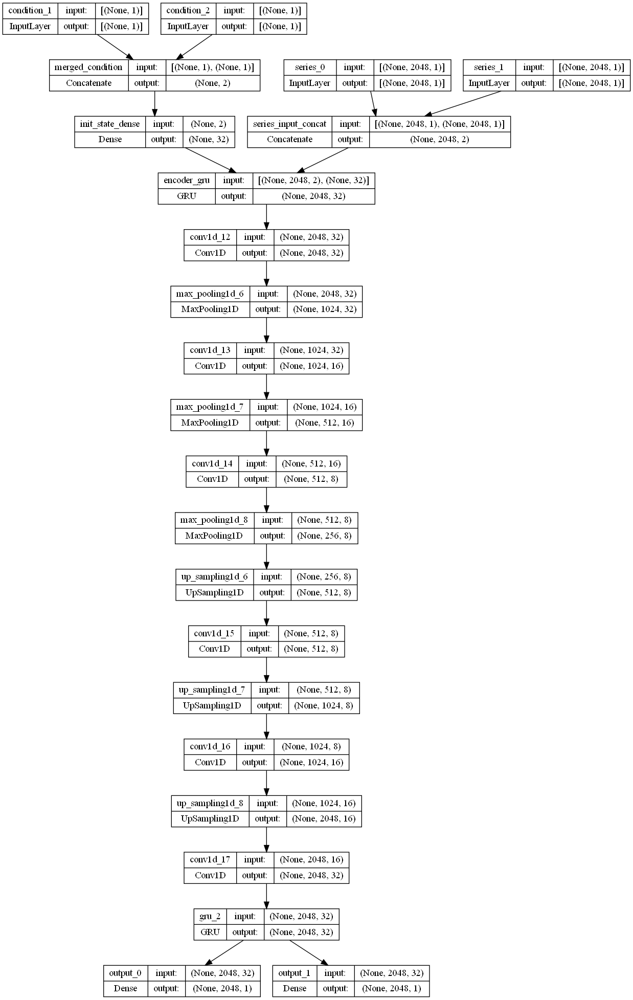

In [22]:
plot_model(my_ccae_model_trained, to_file=os.path.join(model_folder_path,"model_structure", model_name.replace('.keras', '.png')), show_shapes=True, show_layer_names=True)
#
# plot_model(decoder, show_shapes=True, show_layer_names=True)

# 取出訓練資料 (健康模型) #

In [23]:

from sklearn.model_selection import train_test_split
from test_algs.CCAE_ntu_rul import data_augmentation
import random


# Data set folder 
NTU_dataset_path = r'D:\OneDrive\CCAE_experiments\CCAE_datasets'
Normal_data_path = os.path.join(NTU_dataset_path, 'Normal2')
# 列出此資料夾的所有子資料夾
Normal_subfolders = [f.path for f in os.scandir(Normal_data_path) if f.is_dir()]

exclude_condition="1800_1_0V"  # 排除特定資料夾
Normal_subfolders = [folder for folder in Normal_subfolders if exclude_condition not in folder]

# 分割 20% 資料作為驗證集 80% 資料作為訓練集
train_files = []
val_files = []

for folder in Normal_subfolders:
    parquet_files = [os.path.join(folder, f) for f in os.listdir(folder) if f.endswith(".parquet")]
    # 如果資料夾中有多於一個 parquet 檔案，則隨機進行分割
    if len(parquet_files) > 1:
        train, val = train_test_split(parquet_files, test_size=0.2, random_state=42)
        train_files.extend(train)
        val_files.extend(val)
    elif len(parquet_files) == 1:
        train_files.extend(parquet_files)

# 打亂訓練資料順序，避免batch 中資料條件分布影響訓練結果
random.seed(42)
random.shuffle(train_files)
random.shuffle(val_files)
print(f"Train files: {len(train_files)}")
print(f"Validation files: {len(val_files)}")


from time import time
train_input_signals=[]
torque_conditions=[]
speed_conditions=[]

temp_torque=[]
temp_speed=[]
for file_path in train_files:
    if os.path.exists(file_path):
        
        # read the data
        df = read_rul_data(file_path)
        
        rms = np.sqrt(np.mean(np.square(df["Current alpha downsample"])))
        if rms<0.1:
            print(f"File {file_path} has abnormal RMS current, skipping.")
            continue
        
        # 合併測試資料至訓練維度 shape=(,4000,dim)
        temp_train_input_signals = []
        for input_name in network_input_signal_names:
        # normalization
            raw_data=np.array(df[input_name])  
            # mean = np.mean(raw_data)
            # standard = np.std(raw_data)
            # normalized = (raw_data - mean) / standard  
            normalized = raw_data / network_normalization_rate[input_name]  # 標準化
            augmented_data= data_augmentation(normalized, time_steps=sequence_length, window_size=10, cols=[0], random_seed=42)
            temp_train_input_signals.append(augmented_data) # normalization
            
            # 先做資料增強轉換至 (N*[(L-W)/1024+1], 1024, dim 維度)
            
        # 加入 train_input_signals
        train_input_signals.append(np.stack(temp_train_input_signals, axis=2))
        
        # 將條件擴展為 (temp_train_input_signals[0].shape[0], 1)
        torque_value_pu = np.array(df["Torque avg"]).reshape(-1)/ rated_torque
        speed_value_pu = np.array(df["Speed"]).reshape(-1) / rated_speed
        temp_torque.append(torque_value_pu[0])
        temp_speed.append(speed_value_pu[0])
        torque_expanded = np.full(temp_train_input_signals[0].shape[0], torque_value_pu[0])
        speed_expanded = np.full(temp_train_input_signals[0].shape[0], speed_value_pu[0])
        torque_conditions.append(torque_expanded)
        speed_conditions.append(speed_expanded)
        
    else:
        print(f"File {file_path} does not exist.")
        
train_input_signals = np.concatenate(train_input_signals,axis=0).astype(np.float32)
torque_conditions = np.concatenate(torque_conditions, axis=0).astype(np.float32)
speed_conditions = np.concatenate(speed_conditions, axis=0).astype(np.float32)

print(f"Train input signals shape: {train_input_signals.shape}")

Train files: 120
Validation files: 32
Train input signals shape: (71520, 2048, 2)


# 模型訓練 #

In [24]:
import time
import tensorflow as tf
import tensorflow.keras.backend as K
import gc


def CCAE_train(keras_model, model_type: str, input_data, condition1_data, condition2_data, epochs=20, batch_size=10, use_cpu=False):
    # condition1_data, condition2_data shape: (N,) or (N, 1)
    if condition1_data.ndim == 1:
        condition1_data = condition1_data.reshape(-1, 1)
    if condition2_data.ndim == 1:
        condition2_data = condition2_data.reshape(-1, 1)

    # split train/val
    train_data, val_data, train_cond1, val_cond1, train_cond2, val_cond2 = train_test_split(
        input_data, condition1_data, condition2_data, test_size=0.2, random_state=38, shuffle=True
    )

    # 拆分 input/output
    if model_type == 'I2_in_I2_out':
        train_input = [train_data[:, :, i] for i in range(input_data.shape[2])]
        val_input = [val_data[:, :, i] for i in range(input_data.shape[2])]
        train_output = train_input.copy()
        val_output = val_input.copy()
    elif model_type == 'V2_in_I2_out':
        train_input = [train_data[:, :, i] for i in range(2)]
        val_input = [val_data[:, :, i] for i in range(2)]
        train_output = [train_data[:, :, i] for i in range(2, 4)]
        val_output = [val_data[:, :, i] for i in range(2, 4)]
    elif model_type == 'V2I2_in_V2I2_out':
        train_input = [train_data[:, :, i] for i in range(input_data.shape[2])]
        val_input = [val_data[:, :, i] for i in range(input_data.shape[2])]
        train_output = train_input.copy()
        val_output = val_input.copy()
    else:
        raise ValueError("Unknown model_type")

    # condition 輸入兩份（不同）
    train_input += [train_cond1, train_cond2]
    val_input += [val_cond1, val_cond2]

    keras_model.compile(optimizer='Adam', loss='mse')

    if use_cpu:
        with tf.device('/CPU:0'):
            history = keras_model.fit(
                train_input, train_output,
                epochs=epochs,
                batch_size=batch_size,
                validation_data=(val_input, val_output)
            )
    else:
        history = keras_model.fit(
            train_input, train_output,
            epochs=epochs,
            batch_size=batch_size,
            validation_data=(val_input, val_output)
        )

    return keras_model, history


if os.path.exists(os.path.join(model_folder_path, "models", model_name)):
    
    # 如果模型已存在，則載入模型
    print(f"Model {model_name} exists, loading the model.")
    my_ccae_model_trained = load_model(os.path.join(model_folder_path, "models", model_name), compile=False)
    print(f"Model {model_name} loaded successfully.")
    
    # 讀取模型的 json metadata
    metadata_path = os.path.join(model_folder_path, "model_inform", model_name.replace('.keras', '_metadata.json'))
    with open(metadata_path, "r", encoding="utf-8") as f:
        model_metadata = json.load(f)
    
    #若非則重新訓練模型
    # --------------------模型訓練---------------------
    if  (not model_metadata.get("trained", False)) or model_retraining:
        print(f"Model {model_name} has not been trained yet, proceeding with training.")
        
        # 設定訓練屬性並儲存
        time_start = time.time()
        Labels = np.full(train_input_signals.shape[0], 1)
        epochs=10
        batch_size=64
        
        # 清理記憶體
        K.clear_session()
        gc.collect()
        my_ccae_model1_trained, train_history= CCAE_train(my_ccae_model_trained, model_type, train_input_signals,
                                                          torque_conditions, speed_conditions, epochs, batch_size, use_cpu=False)
        
        # 清理記憶體
        K.clear_session()
        gc.collect()
        my_ccae_model_trained.save(os.path.join(model_folder_path, "models", model_name))
        
        # 更新模型 metadata
        model_metadata["trained"] = True
        model_metadata["train_date"] = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        model_metadata["taining time"] = time.time() - time_start
        with open(os.path.join(model_folder_path,"model_inform", model_name.replace('.keras', '_metadata.json')), "w", encoding="utf-8") as f:
                json.dump(model_metadata, f, ensure_ascii=False, indent=4)

        print("Training complete, elpased time:", time.time() - time_start)
        print(f"Model {model_name} trained and saved successfully.")

        # 繪製 Loss
        plt.figure()
        plt.plot(train_history.history['loss'], label='Train Loss')
        plt.plot(train_history.history['val_loss'], label='Validation Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Model Loss Over Epochs')
        plt.legend()

        
        plt.grid(True)
        plt.show()
else :
    # 如果模型不存在，則拋出錯誤
    raise FileNotFoundError(f"Model {model_name} does not exist in {os.path.join(model_folder_path, 'models')}.")

Model CCAE_I2_in_I2_out_GRU_initial_condition_2048.keras exists, loading the model.
Model CCAE_I2_in_I2_out_GRU_initial_condition_2048.keras loaded successfully.


In [25]:

val_input_signals=[]
val_torque_conditions=[]
val_speed_conditions=[]
# 取出增強訓練資料
for file_path in val_files:
    if os.path.exists(file_path):
        
        # read the data
        df = read_rul_data(file_path)
        
        # 合併測試資料至訓練維度 shape=(,4000,dim)
        temp_train_input_signals = []
        for input_name in network_input_signal_names:
        # normalization
            raw_data=np.array(df[input_name])
            # mean = np.mean(raw_data)
            # standard = np.std(raw_data)
            # normalized = (raw_data - mean) / standard  # 轉成 (1024, 1)
            normalized = raw_data / network_normalization_rate[input_name]  # 標準化
            augmented_data= data_augmentation(normalized, time_steps=sequence_length, window_size=10, cols=[0], random_seed=42)
            temp_train_input_signals.append(augmented_data) # normalization
            
            # 先做資料增強轉換至 (N*[(L-W)/1024+1], 1024, dim 維度)
            
        # 加入 train_input_s
        # ignals
        val_input_signals.append(np.stack(temp_train_input_signals, axis=2))
        
        # 將條件擴展為 (temp_train_input_signals[0].shape[0], 1)
        speed_value_pu = np.array(df["Torque avg"]).reshape(-1)/ rated_torque
        speed_value_pu = np.array(df["Speed"]).reshape(-1) / rated_speed
        torque_expanded = np.full(temp_train_input_signals[0].shape[0], speed_value_pu[0])
        speed_expanded = np.full(temp_train_input_signals[0].shape[0], speed_value_pu[0])
        val_torque_conditions.append(torque_expanded)
        val_speed_conditions.append(speed_expanded)
        
    else:
        print(f"File {file_path} does not exist.")
        
val_input_signals_all_type = np.concatenate(val_input_signals,axis=0)
val_torque_conditions = np.concatenate(val_torque_conditions, axis=0)
val_speed_conditions = np.concatenate(val_speed_conditions, axis=0)

# 準備模型輸入，針對不同模型類型進行處理
if model_type == 'I2_in_I2_out':
    val_input_signals_type=val_input_signals_all_type[:, :, : ]
    val_output_signals_type=val_input_signals_type.copy()
if model_type == 'V2_in_I2_out':
    val_input_signals_type=val_input_signals_all_type[:, :,:2 ] 
    val_output_signals_type=val_input_signals_all_type[:, :,2:4 ] 
elif model_type == 'V2I2_in_V2I2_out':
    val_input_signals_type=val_input_signals_all_type
    val_output_signals_type=val_input_signals_type.copy()
    
training_validation_result = my_ccae_model_trained.predict(
    [val_input_signals_type[:, :, i] for i in range(val_input_signals_type.shape[2])] + 
    [val_torque_conditions, val_speed_conditions],
    batch_size=128,  # ⚠ 減少 batch size
    verbose=1
)

149/149 [==============================] - 12s 75ms/step


驗證重建結果

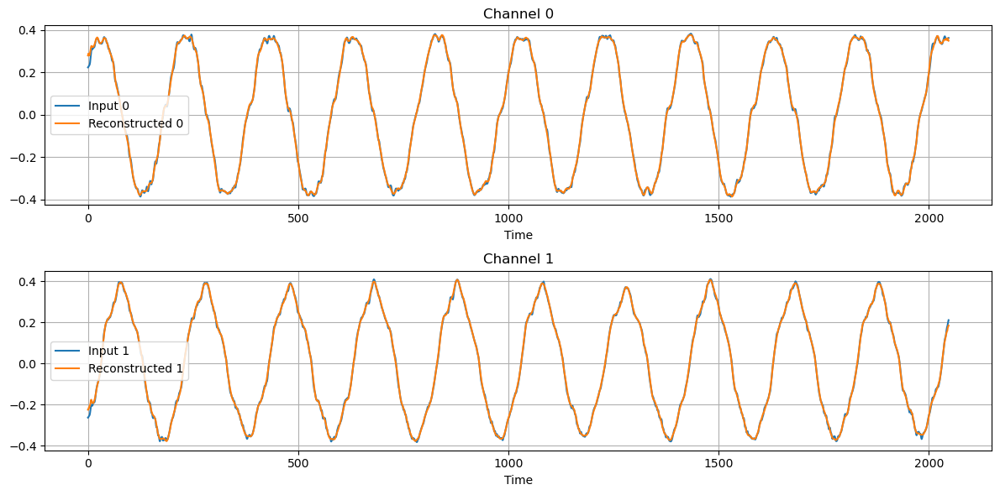

In [26]:
# 取出第一筆驗證資料的輸入與重建結果，根據 channel 數自動繪圖
idx = 0
num_channels = val_output_signals_type.shape[2]
plt.figure(figsize=(12, 3 * num_channels))

for ch in range(num_channels):
    input_ch = val_output_signals_type[idx, :, ch]
    recon_ch = training_validation_result[ch][idx, :, 0]
    plt.subplot(num_channels, 1, ch + 1)
    plt.plot(input_ch, label=f'Input {ch}')
    plt.plot(recon_ch, label=f'Reconstructed {ch}')
    plt.title(f'Channel {ch}')
    plt.xlabel('Time')
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()


# 取出第一筆驗證資料的輸入與重建結果，根據 channel 數自動繪圖
idx = 0
num_channels = train_input_signals.shape[2]
train_predict_ch = my_ccae_model_trained.predict(
    [train_input_signals[0:1, :, i] for i in range(train_input_signals.shape[2])] + 
    [torque_conditions[0:1], speed_conditions[0:1]],
    batch_size=128,  # ⚠ 減少 batch size
    verbose=0
)
# plt.figure(figsize=(12, 3 * num_channels))

# for ch in range(num_channels):
#     input_ch = val_output_signals_type[idx, :, ch]
   
#     recon_ch = training_validation_result[ch][idx, :, 0]
#     plt.subplot(num_channels, 1, ch + 1)
#     plt.plot(input_ch, label=f'Input {ch}')
#     plt.plot(recon_ch, label=f'Reconstructed {ch}')
#     plt.title(f'Channel {ch}')
#     plt.xlabel('Time')
#     plt.legend()
#     plt.grid(True)

# plt.tight_layout()
# plt.show()


In [27]:
import random
import tensorflow as tf
import gc
import importlib
from rul_features.rul_data_read import read_rul_data
import os
import numpy as np
importlib.reload(importlib.import_module('rul_features.rul_data_read'))

def apply_model_to_all_ciondition(Normal_data_path, sample_factor):
    
    # 取得 Normal_data_path 下所有子資料夾
    subfolders = [f.path for f in os.scandir(Normal_data_path) if f.is_dir()]
   
    mse_results = {}

    for folder in subfolders:
        # 取得該子資料夾下所有 parquet 檔案
        parquet_files = [os.path.join(folder, f) for f in os.listdir(folder) if f.endswith(".parquet")]
        if len(parquet_files) == 0:
            continue
        # 隨機選取 50% 檔案
        random.shuffle(parquet_files)
        # 用 0.5 比例隨機採樣
        num_select = max(1, int(len(parquet_files) * sample_factor))
        selected_files = random.sample(parquet_files, num_select)
        folder_mses = []
        
        apply_input_signals=[]
        apply_torque_conditions=[]
        apply_speed_conditions=[]
        
        for file_path in selected_files:
            try:
                # 讀取 parquet 檔案
                df = read_rul_data(file_path)
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
                raise e
            rms = np.sqrt(np.mean(np.square(df["Current alpha downsample"])))
            if rms<0.1:
                print(f"File {file_path} has abnormal RMS current, skipping.")
                continue
            # 依據 network_input_signal_names 做 normalization 並切片
            temp_signals = []
            for input_name in network_input_signal_names:
                raw_data = np.array(df[input_name])
                # mean = np.mean(raw_data)
                # std = np.std(raw_data)
                # normalized = (raw_data - mean) / std
                normalized = raw_data / network_normalization_rate[input_name]
                augmented_data= data_augmentation(normalized, time_steps=sequence_length, window_size=10, cols=[0], random_seed=42)
                temp_signals.append(augmented_data) # normalization
            # shape: (num_slices, 1024, num_channels)
            
            # 加入 train_input_signals
            apply_input_signals.append(np.stack(temp_signals, axis=2))
                
            # 將條件擴展為 (temp_train_input_signals[0].shape[0], 1)
            torque_value_pu = np.array(df["Torque avg"]).reshape(-1) / rated_torque
            torque_value_pu = np.array(df["Speed"]).reshape(-1) / rated_speed
            torque_expanded = np.full(apply_input_signals[0].shape[0], torque_value_pu[0])
            speed_expanded = np.full(apply_input_signals[0].shape[0], torque_value_pu[0])
            apply_torque_conditions.append(torque_expanded)
            apply_speed_conditions.append(speed_expanded)
        
        apply_input_signals = np.concatenate(apply_input_signals,axis=0)
        apply_torque_conditions = np.concatenate(apply_torque_conditions, axis=0)
        apply_speed_conditions = np.concatenate(apply_speed_conditions, axis=0)
        
        # 準備模型輸入，針對不同模型類型進行處理
        if model_type == 'I2_in_I2_out':
            predict_input_signals_type=apply_input_signals[:, :, : ]
        if model_type == 'V2_in_I2_out':
            predict_input_signals_type=apply_input_signals[:, :,:2 ] 
        elif model_type == 'V2I2_in_V2I2_out':
            predict_input_signals_type=apply_input_signals
        
        # 單位為同一資料夾之資料不須和外合併，直接預測
        # with tf.device('/CPU:0'):
        preds_per_condition = my_ccae_model_trained.predict([predict_input_signals_type[:, :, i] for i in range(predict_input_signals_type.shape[2])] + [apply_torque_conditions, apply_speed_conditions],
                                                                batch_size=256, verbose=1)
        tf.keras.backend.clear_session()
        gc.collect()
        # 計算每個 condition 下的 MSE（不合併，保留原始資料集）
        mses_per_condition = []
        for i in range(len(preds_per_condition)):
            mse = np.mean((preds_per_condition[i].squeeze() - apply_input_signals[:, :, i]) ** 2, axis=1)
            mses_per_condition.append(mse)
        # mses_per_condition: list，每個元素 shape=(num_samples,)
        folder_mses.append(mses_per_condition)
        # 將資料夾名稱前面的日期與底線去掉
        folder_name = os.path.basename(folder)
        # 假設格式為 "0529_1200_0_5V"，去掉前面的 "0529_"
        if "_" in folder_name:
            folder_name = folder_name.split("_", 1)[1]
            
        mse_results[folder_name] = folder_mses
        
    return mse_results


sample_factor=0.25

# 將所有 mse results 組成一個 dict，方便後續統一處理
verify_mse_results = {
    "Normal": apply_model_to_all_ciondition(os.path.join(NTU_dataset_path, 'Normal'), sample_factor),
    "drill_2X2": apply_model_to_all_ciondition(os.path.join(NTU_dataset_path, 'drill 2X2'), sample_factor),
    "Cut_2mm": apply_model_to_all_ciondition(os.path.join(NTU_dataset_path, 'Cut_2mm'), sample_factor),
    "drill_1X2": apply_model_to_all_ciondition(os.path.join(NTU_dataset_path, 'drill 1X2'), sample_factor),
    "drill_2X1": apply_model_to_all_ciondition(os.path.join(NTU_dataset_path, 'drill 2X1'), sample_factor),
    "Normal1": apply_model_to_all_ciondition(os.path.join(NTU_dataset_path, 'Normal1'), sample_factor),
    "Normal2": apply_model_to_all_ciondition(os.path.join(NTU_dataset_path, 'Normal2'), sample_factor),
    "Wearout1": apply_model_to_all_ciondition(os.path.join(NTU_dataset_path, 'Wearout1'), sample_factor),
    "Wearout2": apply_model_to_all_ciondition(os.path.join(NTU_dataset_path, 'Wearout2'), sample_factor),
}



10/10 [==============================] - 1s 79ms/step
File D:\OneDrive\CCAE_experiments\CCAE_datasets\drill 2X2\0531_1200_0_5V\RUL_Data_3_1.parquet has abnormal RMS current, skipping.
File D:\OneDrive\CCAE_experiments\CCAE_datasets\drill 2X2\0531_1200_0_5V\RUL_Data_3_3.parquet has abnormal RMS current, skipping.
10/10 [==============================] - 1s 82ms/step


## 取得訓練樣本分布用以參考 ##

In [28]:
import os
from collections import defaultdict

# 按照 train_files 最後一個資料夾名稱劃分 train_files 中的檔案路徑

folder_to_files = defaultdict(list)
for f in train_files:
    folder = os.path.basename(os.path.dirname(f))
    # 去掉前綴日期與底線
    if "_" in folder:
        folder = folder.split("_", 1)[1]
    folder_to_files[folder].append(f)

# 顯示分組結果
for folder, files in folder_to_files.items():
    print(f"{folder}: {len(files)} files")


# 紀錄訓練及的重建mse 以做比較
train_mse_dict = {}

for folder, files in folder_to_files.items():
    mse_list = []
    for file_path in files:
        # 讀取資料
        df = read_rul_data(file_path)
        if rms<0.1:
            print(f"File {file_path} has abnormal RMS current, skipping.")
            continue
        # 依 network_input_signal_names 做 normalization
        temp_signals = []
        for input_name in network_input_signal_names:
            raw_data = np.array(df[input_name])
            normalized = raw_data / network_normalization_rate[input_name]
            augmented_data = data_augmentation(normalized, time_steps=sequence_length, window_size=10, cols=[0], random_seed=42)
            temp_signals.append(augmented_data)
        input_signals = np.stack(temp_signals, axis=2)
        # 條件
        torque_value_pu = np.array(df["Torque avg"]).reshape(-1) / rated_torque
        speed_value_pu = np.array(df["Speed"]).reshape(-1) / rated_speed
        torque_expanded = np.full(input_signals.shape[0], torque_value_pu[0])
        speed_expanded = np.full(input_signals.shape[0], speed_value_pu[0])
        # 預測
        preds = my_ccae_model_trained.predict(
            [input_signals[:, :, i] for i in range(input_signals.shape[2])] + [torque_expanded, speed_expanded],
            batch_size=512, verbose=2
        )
        # 計算每個 channel 的 MSE
        mses_per_channel = []
        for i in range(len(preds)):
            mse = np.mean((preds[i].squeeze() - input_signals[:, :, i]) ** 2, axis=1)
            mses_per_channel.append(mse)
        mse_list.append(mses_per_channel)
    train_mse_dict[folder] = mse_list

# folder_mse_dict 的格式與 apply_model_to_all_ciondition 相同，可直接用於後續分析



1200_0_5V: 15 files
3000_0_5V: 15 files
3000_1_0V: 15 files
3000_2_0V: 15 files
1200_2_0V: 15 files
1800_0_5V: 15 files
1200_1_0V: 15 files
1800_2_0V: 15 files
2/2 - 0s - 371ms/epoch - 186ms/step
2/2 - 0s - 177ms/epoch - 89ms/step
2/2 - 0s - 180ms/epoch - 90ms/step
2/2 - 0s - 180ms/epoch - 90ms/step
2/2 - 0s - 189ms/epoch - 94ms/step
2/2 - 0s - 189ms/epoch - 94ms/step
2/2 - 0s - 189ms/epoch - 95ms/step
2/2 - 0s - 188ms/epoch - 94ms/step
2/2 - 0s - 180ms/epoch - 90ms/step
2/2 - 0s - 178ms/epoch - 89ms/step
2/2 - 0s - 187ms/epoch - 94ms/step
2/2 - 0s - 188ms/epoch - 94ms/step
2/2 - 0s - 187ms/epoch - 94ms/step
2/2 - 0s - 185ms/epoch - 93ms/step
2/2 - 0s - 176ms/epoch - 88ms/step
2/2 - 0s - 182ms/epoch - 91ms/step
2/2 - 0s - 177ms/epoch - 88ms/step
2/2 - 0s - 184ms/epoch - 92ms/step
2/2 - 0s - 180ms/epoch - 90ms/step
2/2 - 0s - 182ms/epoch - 91ms/step
2/2 - 0s - 183ms/epoch - 92ms/step
2/2 - 0s - 185ms/epoch - 93ms/step
2/2 - 0s - 232ms/epoch - 116ms/step
2/2 - 0s - 190ms/epoch - 95ms/ste

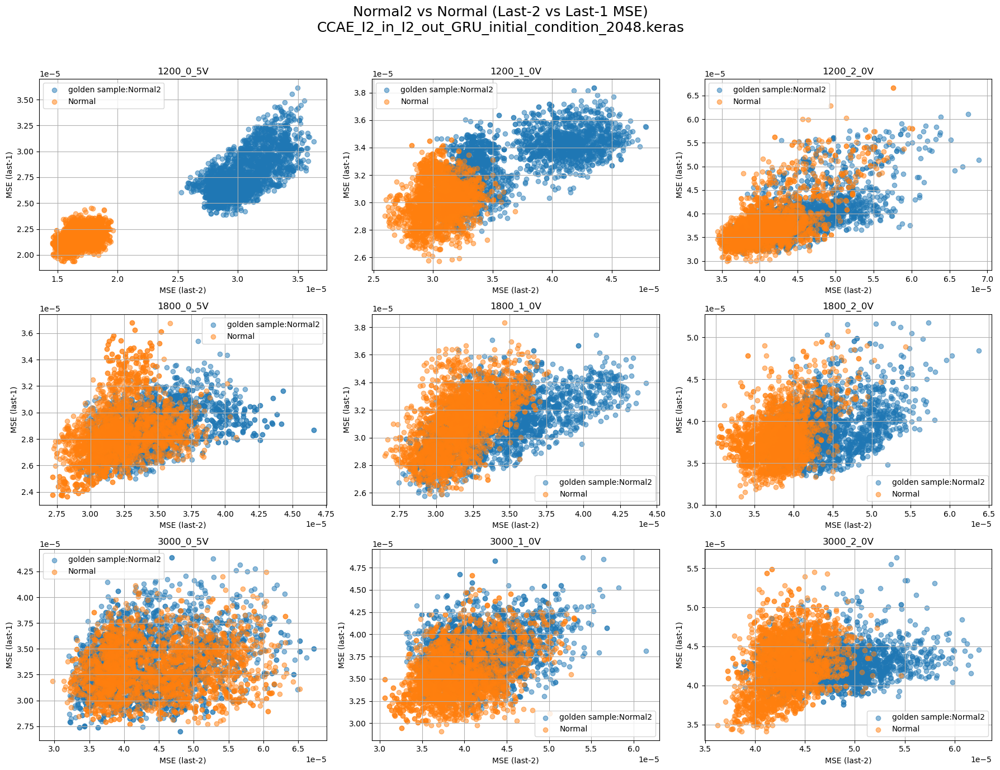

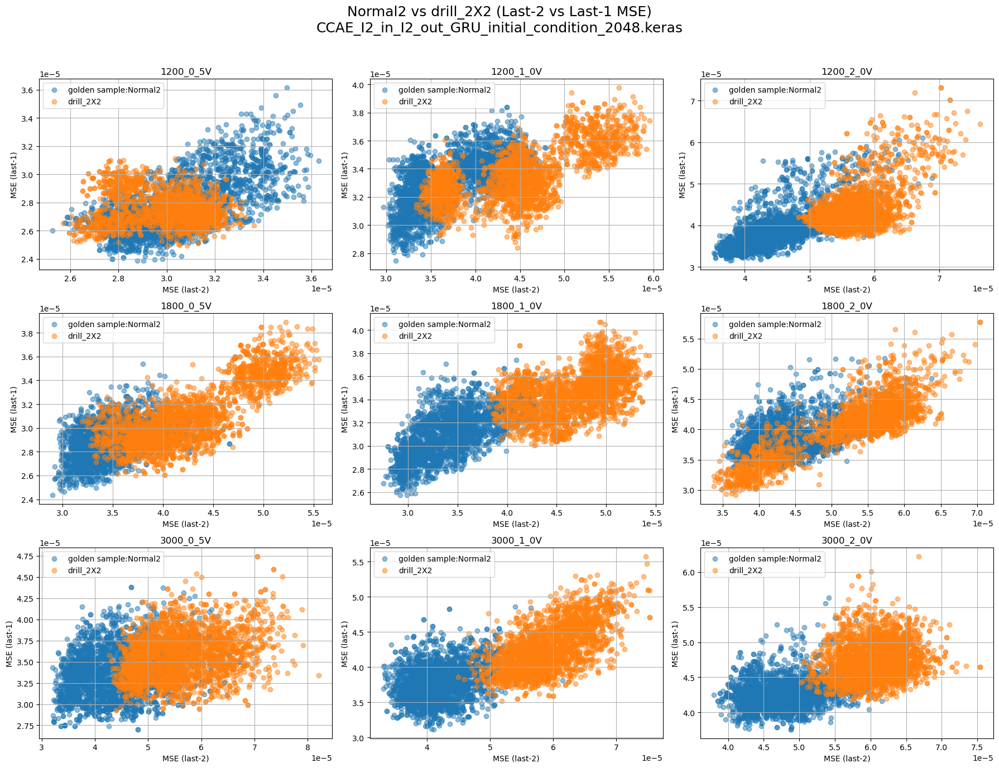

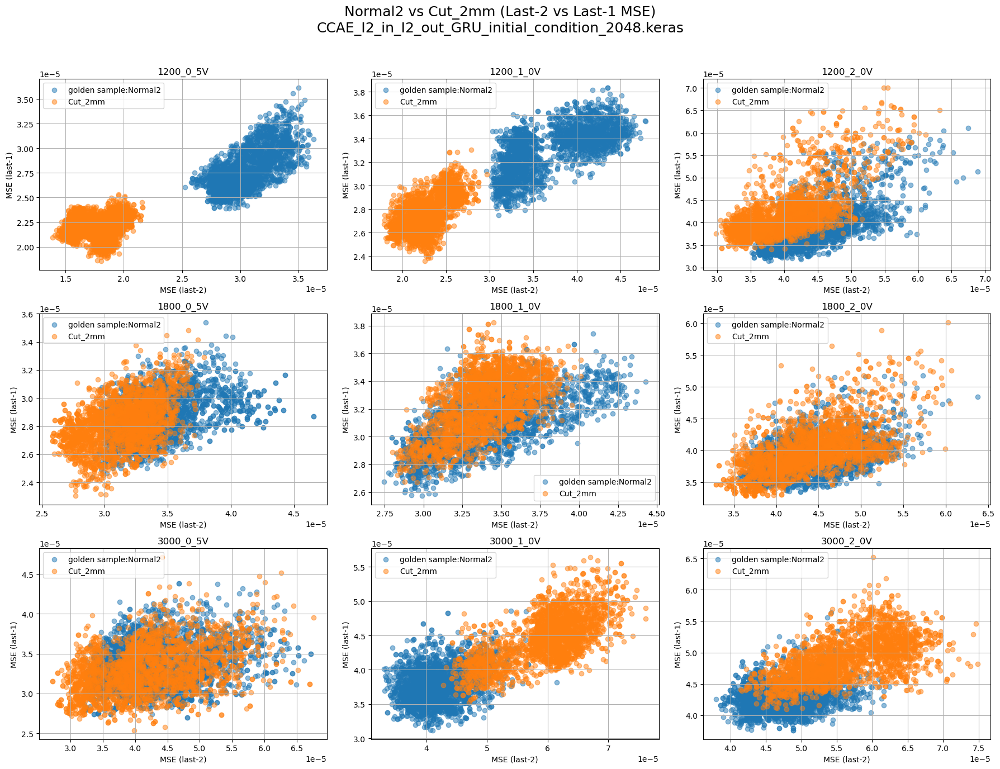

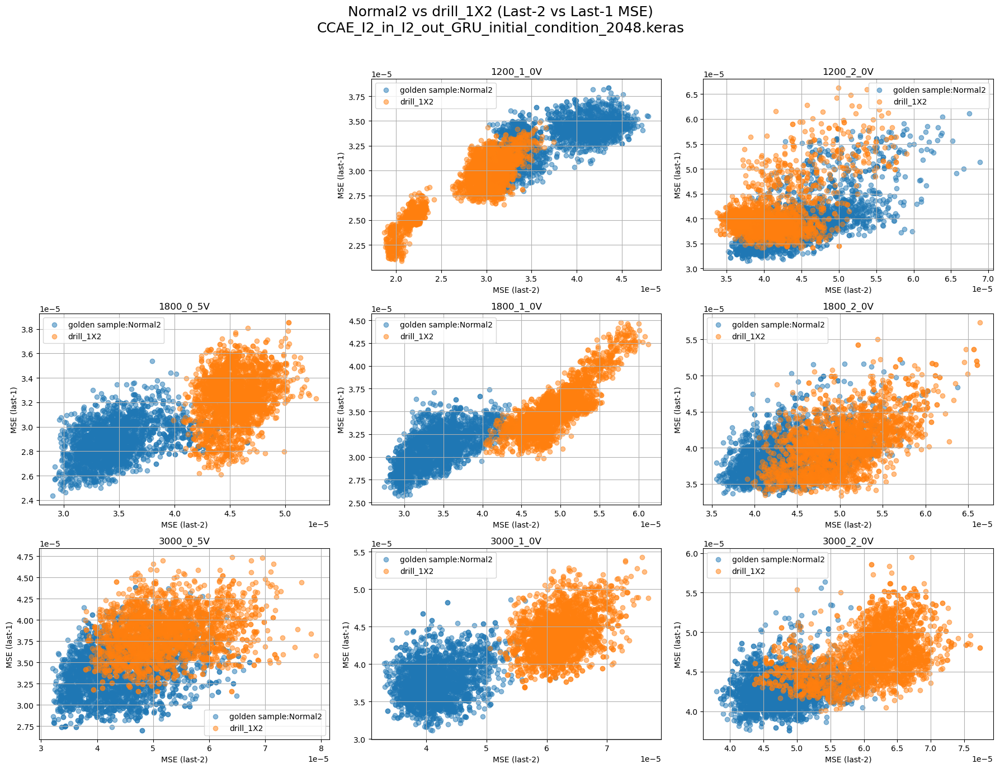

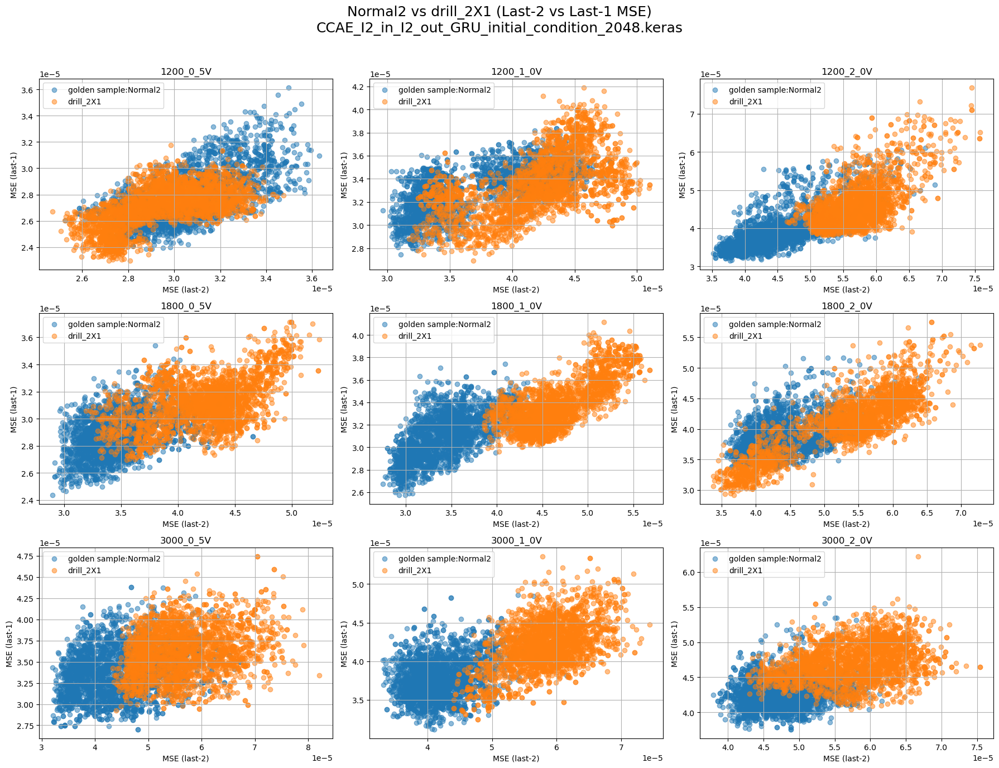

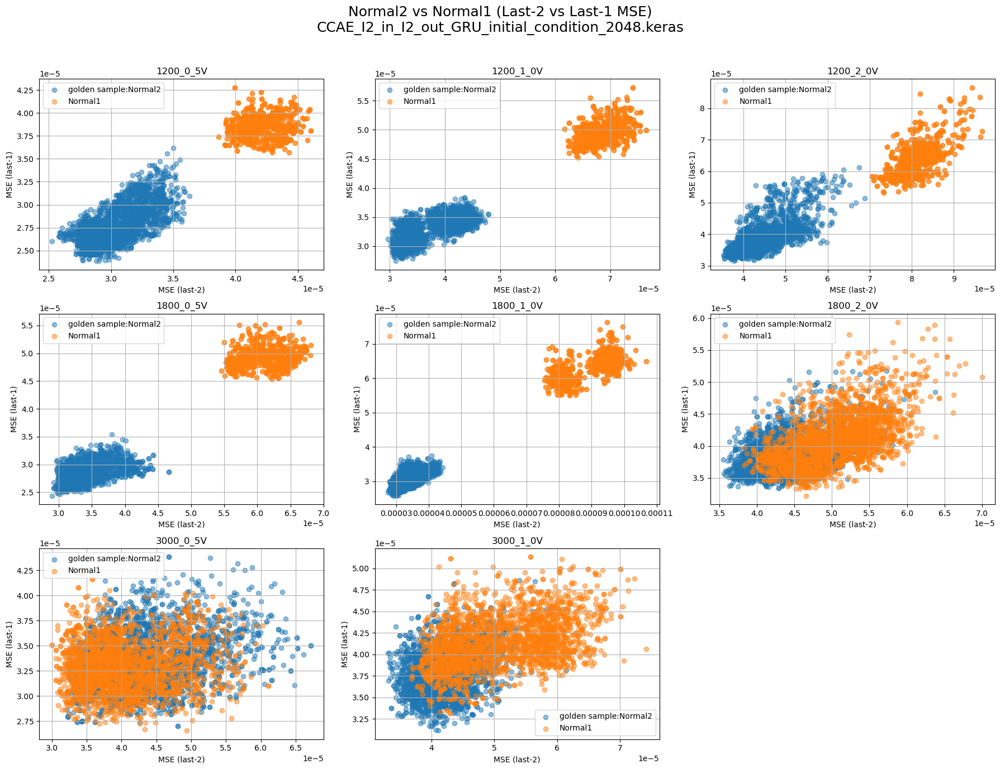

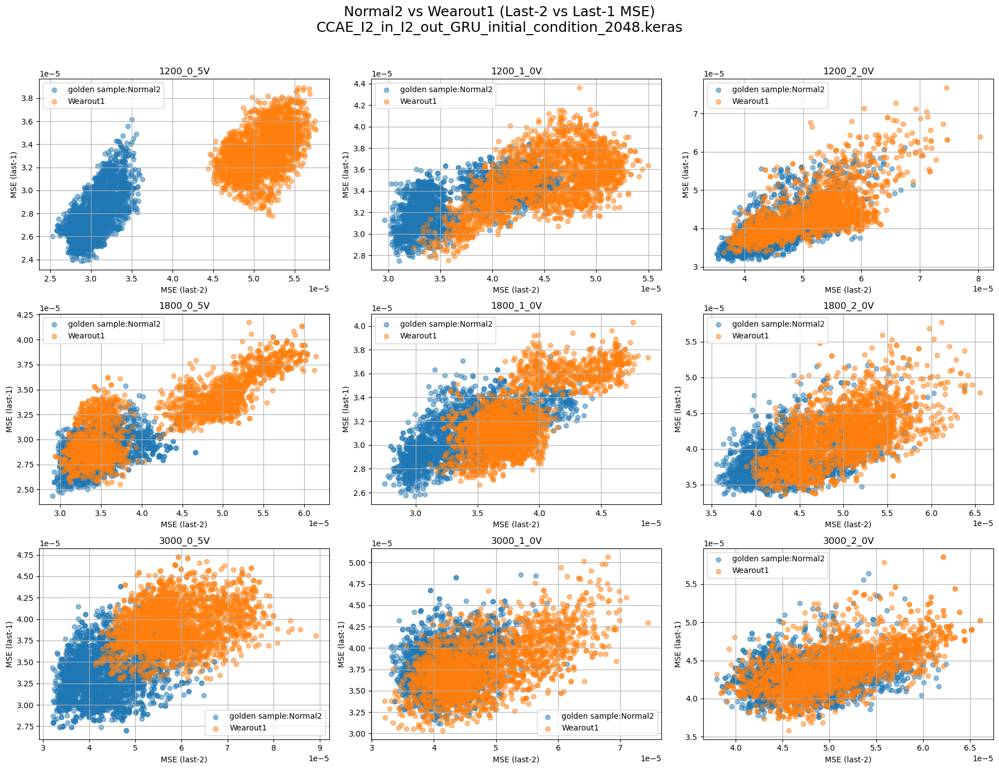

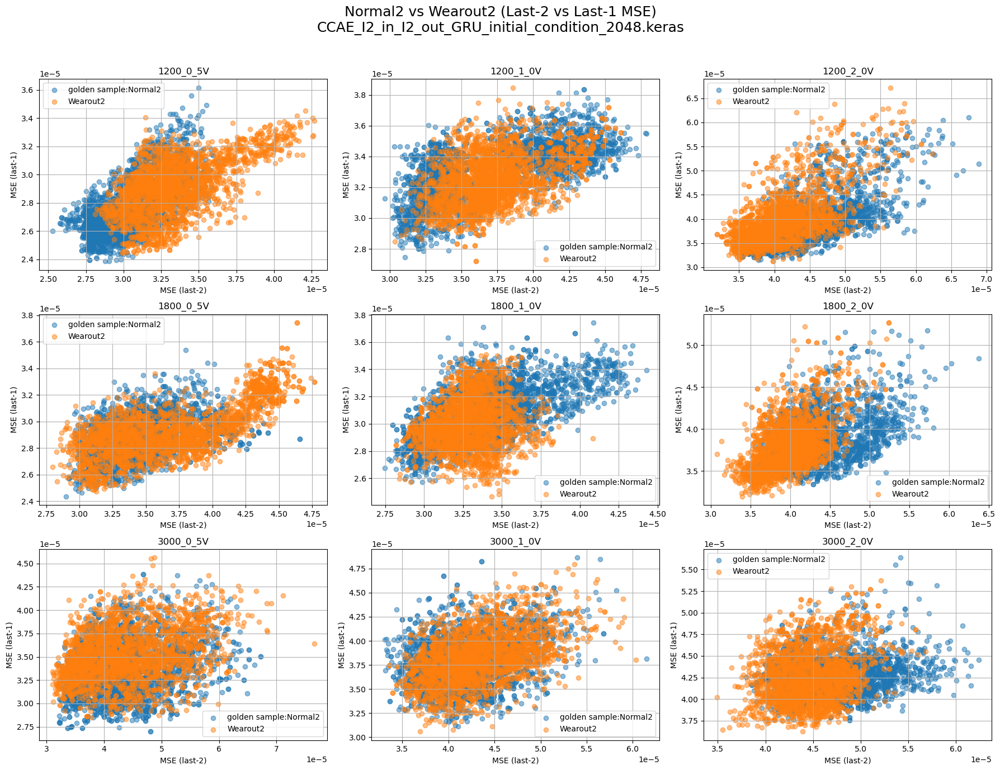

In [29]:
import numpy as np
import matplotlib.pyplot as plt




# 比較所有 verify_mse_results 的 xy 分布（last-2 vs last-1 MSE），每個 condition 都和 Normal 做比較
golden_sample="Normal2"  # 用 Normal2 作為 golden sample
normal_dict = verify_mse_results[golden_sample]
folders = list(normal_dict.keys())
num_folders = len(folders)
num_figs = int(np.ceil(num_folders / 9))

for condition, cond_dict in verify_mse_results.items():
    if condition == golden_sample:
        continue  # 跳過自己比自己
    for fig_idx in range(num_figs):
        fig, axes = plt.subplots(3, 3, figsize=(18, 14))
        fig.suptitle(f"{golden_sample} vs {condition} (Last-2 vs Last-1 MSE)\n{model_name}", fontsize=18)
        for i in range(9):
            folder_idx = fig_idx * 9 + i
            if folder_idx >= num_folders:
                axes.flat[i].set_visible(False)
                continue
            folder = folders[folder_idx]
            ax = axes.flat[i]
            # 取 Normal mse
            if folder in normal_dict and folder in cond_dict:
                mse_arrays_normal = normal_dict[folder][0]
                mse_arrays_cond = cond_dict[folder][0]
                if len(mse_arrays_normal) >= 2 and len(mse_arrays_cond) >= 2:
                    x_normal = mse_arrays_normal[-2].flatten()
                    y_normal = mse_arrays_normal[-1].flatten()
                    x_cond = mse_arrays_cond[-2].flatten()
                    y_cond = mse_arrays_cond[-1].flatten()
                    
                    
                    ax.scatter(x_normal, y_normal, alpha=0.5, label=f"golden sample:{golden_sample}", color='tab:blue')
                    ax.scatter(x_cond, y_cond, alpha=0.5, label=condition, color='tab:orange')
                    if folder in train_mse_dict:
                        x_train=train_mse_dict[folder][0][-2].flatten()
                        y_train=train_mse_dict[folder][0][-1].flatten()
                        # ax.scatter(x_train, y_train, alpha=0.5, label='train mse', color='tab:red')
                    ax.set_xlabel("MSE (last-2)")
                    ax.set_ylabel("MSE (last-1)")
                    ax.set_title(folder)
                    ax.legend()
                    ax.grid(True)
                else:
                    ax.set_visible(False)
            else:
                ax.set_visible(False)
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()
        
        # 建立儲存資料夾
        save_dir = os.path.join("NTU_rul_models", "model_result", model_name)
        os.makedirs(save_dir, exist_ok=True)
        # 儲存圖檔
        fig_path = os.path.join(save_dir, f"{golden_sample}_vs_{condition}_part{fig_idx+1}.png")
        fig.savefig(fig_path)
        plt.close(fig)